# Pretrain a LLM model

In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

from utils import GPTModel, generate_text_simple, create_dataloader_v1, MultiHeadAttention

In [2]:
GPT_CONFIG_124M = {
    "vocab_size": 50257,
    "context_length": 256, # shortened context length (original: 1024)
    "emb_dim": 768,
    "n_heads": 12,
    "n_layers": 12,
    "drop_rate": 0.1,
    "qkv_bias": False
}

## Use (untrained) LLM to make inference for text generation

In [3]:
torch.manual_seed(123)
model = GPTModel(GPT_CONFIG_124M)
model.eval(); # disable dropout during inference (no random dropping during inference)

In [4]:
import tiktoken

def text_to_token_ids(text, tokenizer):
  encoded = tokenizer.encode(text, allowed_special={'<|endoftext|>'})
  encoded_tensor = torch.tensor(encoded).unsqueeze(0) # add batch dimension
  return encoded_tensor

def token_ids_to_text(token_ids, tokenizer):
  flat = token_ids.squeeze(0) # remove batch dimension
  return tokenizer.decode(flat.tolist())

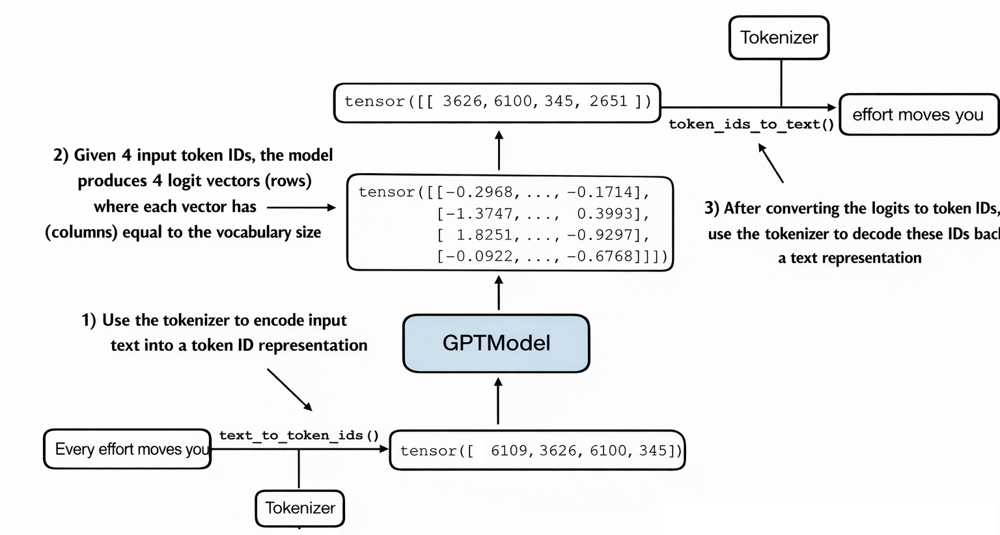

In [5]:
start_context = "Every effort moves you"
tokenizer = tiktoken.get_encoding("gpt2")

token_ids = generate_text_simple(
    model=model,
    idx=text_to_token_ids(start_context, tokenizer),
    max_new_tokens=10,
    context_size=GPT_CONFIG_124M["context_length"]
)

print("Output tokens:\n", token_ids)
print("Output shape:", token_ids.squeeze(0).shape) # drop batch dim
print("Output text:\n", token_ids_to_text(token_ids, tokenizer))

Output tokens:
 tensor([[ 6109,  3626,  6100,   345, 34245,  5139,  2492, 25405, 17434, 17853,
          5308,  3398, 13174, 43071]])
Output shape: torch.Size([14])
Output text:
 Every effort moves you rentingetic wasnم refres RexMeCHicular stren


Our goal is to train the model to produce a better outcome than this.

## Text generation loss

To optimize the generated text outputs, we use a loss function to measure how good or bad the predictions are. This loss guides the model during training, helping it improve its performance over time.

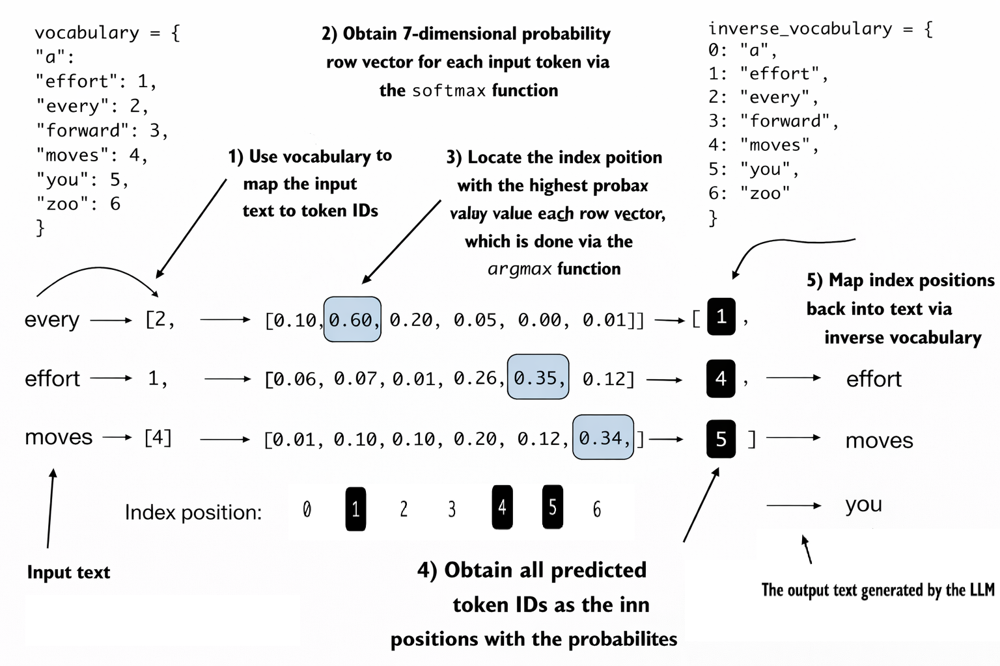

In [6]:
inputs = torch.tensor([[16833, 3626, 6100], # ["every effort moves",
                       [40,    1107, 588]]) #  "I really like"]

# (notice the shifted relationship between inputs and targets)
targets = torch.tensor([[3626, 6100, 345  ], # [" effort moves you",
                        [1107,  588, 11311]]) # " really like chocolate"]

In [7]:
with torch.no_grad():
  logits = model(inputs)

probas = torch.softmax(logits, dim=-1) # probability of each token in vocabulary
print(probas.shape) # (batch_size, num_tokens, vocab_size)
print(probas)

torch.Size([2, 3, 50257])
tensor([[[1.8849e-05, 1.5172e-05, 1.1687e-05,  ..., 2.2409e-05,
          6.9776e-06, 1.8776e-05],
         [9.1569e-06, 1.0062e-05, 7.8786e-06,  ..., 2.9090e-05,
          6.0103e-06, 1.3571e-05],
         [2.9877e-05, 8.8507e-06, 1.5741e-05,  ..., 3.5456e-05,
          1.4094e-05, 1.3526e-05]],

        [[1.2561e-05, 2.0538e-05, 1.4332e-05,  ..., 1.0389e-05,
          3.4784e-05, 1.4239e-05],
         [7.2731e-06, 1.7864e-05, 1.0565e-05,  ..., 2.1206e-05,
          1.1390e-05, 1.5559e-05],
         [2.9496e-05, 3.3605e-05, 4.1029e-05,  ..., 6.5249e-06,
          5.8203e-05, 1.3698e-05]]])


In [8]:
token_ids = torch.argmax(probas, dim=-1, keepdim=True)
print("Token IDs shape:", token_ids.shape)
print("Token IDs:\n", token_ids)

Token IDs shape: torch.Size([2, 3, 1])
Token IDs:
 tensor([[[16657],
         [  339],
         [42826]],

        [[49906],
         [29669],
         [41751]]])


In [9]:
print(f"Targets batch 1: {token_ids_to_text(targets[0], tokenizer)}")
print(f"Outputs batch 1: {token_ids_to_text(token_ids[0].flatten(), tokenizer)}")

Targets batch 1:  effort moves you
Outputs batch 1:  Armed heNetflix


In [10]:
text_idx = 0
print("Target tokens of first sample:", targets[text_idx])
target_probas_1 = probas[text_idx, [0, 1, 2], targets[text_idx]]
print("Text 1:", target_probas_1)

text_idx = 1
print("\nTarget tokens of second sample:", targets[text_idx])
target_probas_2 = probas[text_idx, [0, 1, 2], targets[text_idx]]
print("Text 2:", target_probas_2)

Target tokens of first sample: tensor([3626, 6100,  345])
Text 1: tensor([7.4540e-05, 3.1061e-05, 1.1563e-05])

Target tokens of second sample: tensor([ 1107,   588, 11311])
Text 2: tensor([1.0337e-05, 5.6776e-05, 4.7559e-06])


We inspect the probabilities corresponding to the target tokens (e.g., 3626 and the remaining targets across timesteps). Higher values indicate greater model confidence in predicting the correct tokens.

### Manual loss calculation

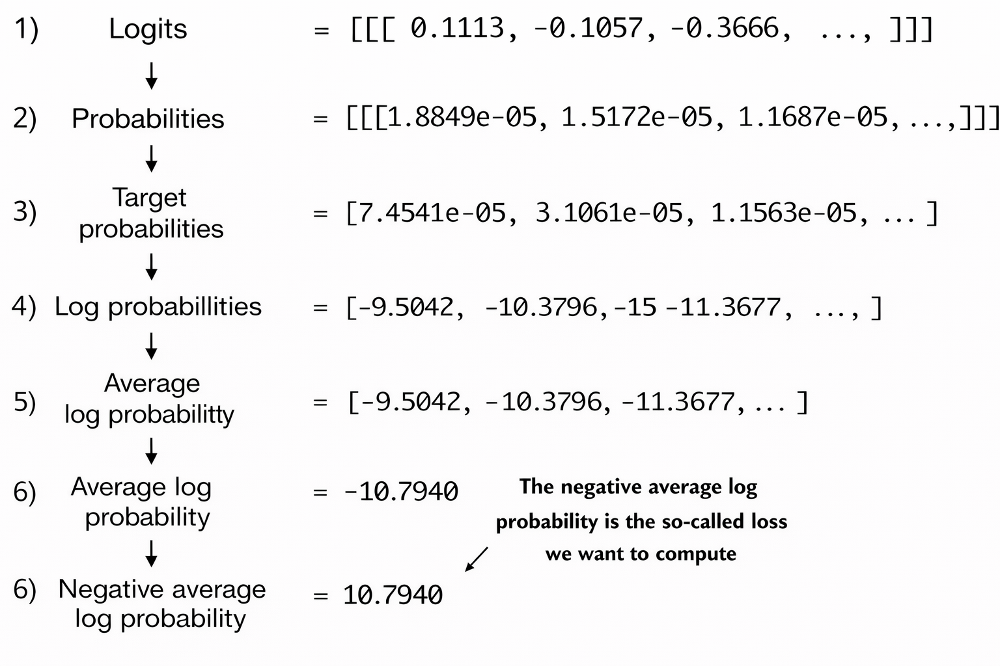

In [11]:
# compute logarithm of all token probabilities
log_probas = torch.log(torch.cat((target_probas_1, target_probas_2)))
print(log_probas)

tensor([ -9.5042, -10.3796, -11.3677, -11.4798,  -9.7764, -12.2561])


In [12]:
# calculate the average probability for each token
avg_log_probas = torch.mean(log_probas)
print(avg_log_probas)

tensor(-10.7940)


In [13]:
neg_avg_log_probas = avg_log_probas * -1
print(neg_avg_log_probas)

tensor(10.7940)


During training, we want the loss to approach 0. A value near 0 means the model assigns very high probability to the correct target tokens. In contrast, the values we currently see (e.g., `[-9.5042, -10.3796, -11.3677, -11.4798, -9.7764, -12.2561]`) are large negative log-probabilities. When exponentiated, they produce very small probabilities such as
tensor(`[7.4540e-05, 3.1061e-05, 1.1563e-05]`) and
tensor(`[1.0337e-05, 5.6776e-05, 4.7559e-06]`),
which means the model is currently not confident in the correct tokens. As training improves, these log-probabilities should get closer to 0, and the corresponding probabilities should move closer to 1.

### Using pyTorch cross-entropy loss

In [14]:
# logits have shape (batch_size, num_tokens, vocab_size)
print("Logits shape:", logits.shape)

# targets have shape (batch_size, num_tokens)
print("Targets shape:", targets.shape)

Logits shape: torch.Size([2, 3, 50257])
Targets shape: torch.Size([2, 3])


In [15]:
# logits are expected from pytorch cross-entropy
logits_flat = logits.flatten(0, 1)
targets_flat = targets.flatten()

print("Flattened logits:", logits_flat.shape)
print("Flattened targets:", targets_flat.shape)

Flattened logits: torch.Size([6, 50257])
Flattened targets: torch.Size([6])


In [16]:
loss = torch.nn.functional.cross_entropy(logits_flat, targets_flat)
print(loss)

tensor(10.7940)


In [17]:
# another metric: how uncertain the model is over the vocabulary.
perplexity = torch.exp(loss)
print(perplexity)

tensor(48725.8203)


In [18]:
# ideal perpexity
torch.exp(torch.tensor(0))

tensor(1.)

## Calculating the training and validation set losses

In [19]:
file_path = "/content/the-verdict.txt"

In [20]:
with open(file_path, "r", encoding="utf-8") as file:
  text_data = file.read()

In [21]:
# display first 99 characters
print(text_data[:99])

# display last 99 characters
print(text_data[-99:])

I HAD always thought Jack Gisburn rather a cheap genius--though a good fellow enough--so it was no 
it for me! The Strouds stand alone, and happen once--but there's no exterminating our kind of art."


In [22]:
# tokenize our dataset
total_characters = len(text_data)
total_tokens = len(tokenizer.encode(text_data))

print("Characters:", total_characters)
print("Tokens:", total_tokens)

Characters: 20479
Tokens: 5145


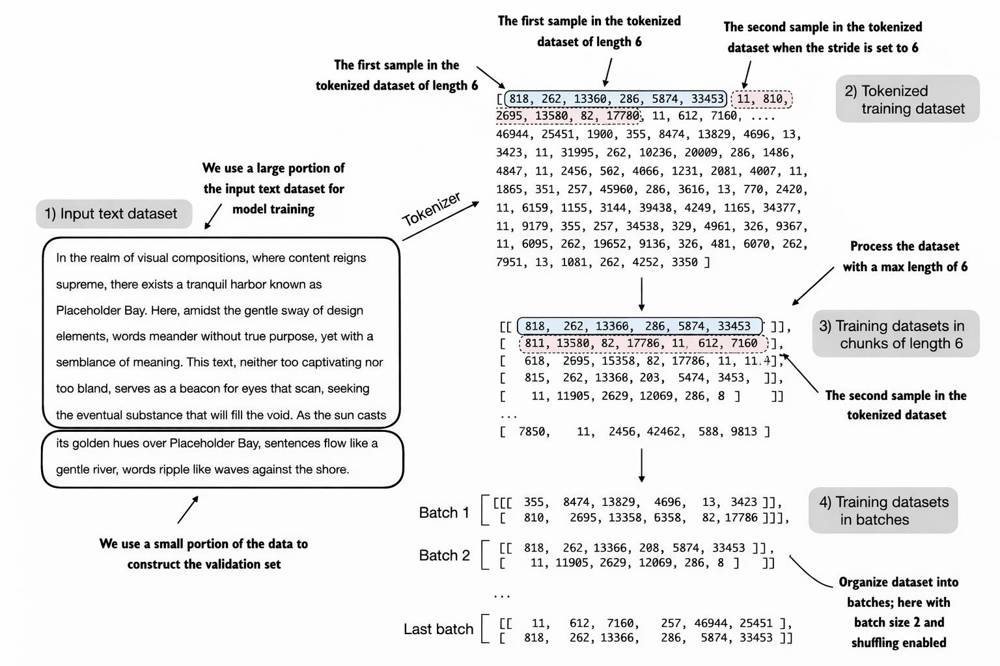

Create train and validation dataloaders.

In [23]:
# train/validation ratio
train_ratio = 0.90
split_idx = int(train_ratio * len(text_data))
train_data = text_data[:split_idx]
val_data = text_data[split_idx:]

In [24]:
# create train and val dataloaders
torch.manual_seed(123)

train_loader = create_dataloader_v1(
    train_data,
    batch_size=2,
    max_length=GPT_CONFIG_124M["context_length"],
    stride=GPT_CONFIG_124M["context_length"],
    drop_last=True,
    shuffle=True,
    num_workers=0
)

val_loader = create_dataloader_v1(
    val_data,
    batch_size=2,
    max_length=GPT_CONFIG_124M["context_length"],
    stride=GPT_CONFIG_124M["context_length"],
    drop_last=False,
    shuffle=False,
    num_workers=0
)

In [25]:
# sanity check
if total_tokens * (train_ratio) < GPT_CONFIG_124M["context_length"]:
  print("Not enough tokens for the training loader. "
        "Try to lower the `GPT_CONFIG_124M['context_length']` or "
        "increase the `training_ratio`")

if total_tokens * (1-train_ratio) < GPT_CONFIG_124M["context_length"]:
  print("Not enough tokens for the validation loader. "
        "Try to lower the `GPT_CONFIG_124M['context_length']` or "
        "decrease the `training_ratio`")

In [26]:
# sanity check (2)
print("Train loader length (num of batches):", len(train_loader))
print("Validation loader legth (num of batches):", len(val_loader))

print("\nTrain loader:")
for x, y in train_loader:
  print(x.shape, y.shape)

print("\nValidation loader:")
for x, y in val_loader:
  print(x.shape, y.shape)

Train loader length (num of batches): 9
Validation loader legth (num of batches): 1

Train loader:
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])
torch.Size([2, 256]) torch.Size([2, 256])

Validation loader:
torch.Size([2, 256]) torch.Size([2, 256])


In [27]:
# sanity check (3)
train_tokens = 0
for input_batch, target_batch in train_loader:
  train_tokens += input_batch.numel()

val_tokens = 0
for input_batch, target_batch in val_loader:
  val_tokens += input_batch.numel()

print("Training tokens:", train_tokens)
print("Validation tokens:", val_tokens)
print("All tokens:", train_tokens + val_tokens)

Training tokens: 4608
Validation tokens: 512
All tokens: 5120


We obtain a total of 5120 tokens, not 5145 as previously estimated. There are two main reasons for this difference. First, the final chunk may be incomplete, so it is discarded as an invalid sample. Second, the dataset length may not be perfectly divisible by the batch size, which leads to a few tokens being left unused. Although this results in a small discrepancy, it is normal in LLM training and does not negatively affect performance.

Create a function to calculate the cross-entropy loss of a given batch.

In [28]:
def calc_loss_batch(input_batch, target_batch, model, device):
  input_batch, target_batch = input_batch.to(device), target_batch.to(device)
  logits = model(input_batch)
  loss = torch.nn.functional.cross_entropy(logits.flatten(0, 1), target_batch.flatten())
  return loss

def calc_loss_loader(data_loader, model, device, num_batches=None):
  total_loss = 0.
  if len(data_loader) == 0:
    return float("nan")
  elif num_batches is None:
    num_batches = len(data_loader)
  else:
    # reduce the number of batches to match the total number of batches in the data loader
    # if num_batches exceeds the number of batches in the data loader
    num_batches = min(num_batches, len(data_loader))
  for i, (input_batch, target_batch) in enumerate(data_loader):
    if i < num_batches:
      loss = calc_loss_batch(input_batch, target_batch, model, device)
      total_loss += loss.item()
    else:
      break
  return total_loss / num_batches

In [29]:
if torch.cuda.is_available():
  device = torch.device("cuda")
elif torch.backends.mps.is_available():
  major, minor = map(int, torch.__version__.split(".")[:2])
  if (major, minor) >= (2, 9):
    device = torch.device("mps")
  else:
    device = torch.device("cpu")
else:
    device = torch.device("cpu")

print(f"Using {device} device.")

Using cuda device.


In [30]:
# test the loss functions
model.to(device)

torch.manual_seed(123)
with torch.no_grad(): # disable gradient tracking for efficiency because we are not training, yet
  train_loss = calc_loss_loader(train_loader, model, device)
  val_loss = calc_loss_loader(val_loader, model, device)

print("Training loss:", train_loss)
print("Validation loss:", val_loss)

Training loss: 10.987583372328016
Validation loss: 10.98110580444336


## Train a LLM model

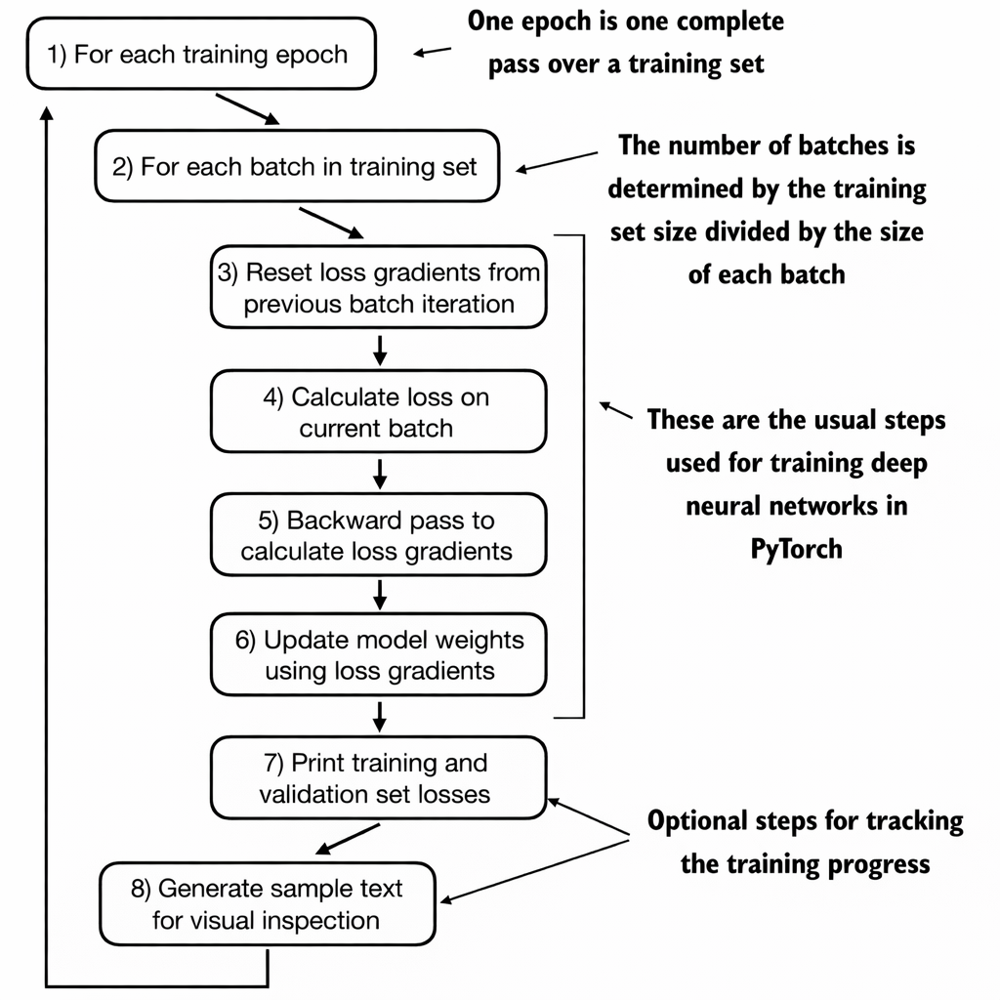

In [31]:
def train_model_simple(model, train_loader, val_loader, optimizer, device, num_epochs, eval_freq, eval_iter, start_context, tokenizer):
  # initialize lists to track losses and tokens seen
  train_losses, val_losses, track_tokens_seen = [], [], []
  tokens_seen, global_step = 0, -1

  # main training loop
  for epoch in range(num_epochs):
    model.train()  # set model to training mode

    for input_batch, target_batch in train_loader:
      optimizer.zero_grad() # reset loss gradients from previous batch iteration
      loss = calc_loss_batch(input_batch, target_batch, model, device)
      loss.backward() # calculate loss gradients
      optimizer.step() # update model weights using loss gradients
      tokens_seen += input_batch.numel()
      global_step += 1

      # optional evaluation step (every 10 batches)
      if global_step % eval_freq == 0:
        train_loss, val_loss = evaluate_model(model, train_loader, val_loader, device, eval_iter)
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        track_tokens_seen.append(tokens_seen)
        print(f"Epoch {epoch+1} (Step {global_step:06d}): "
              f"Train loss {train_loss:.3f}, Val loss {val_loss:.3f}")

    # print a sample text after each epoch
    generate_and_print_sample(model, tokenizer, device, start_context)

  return train_losses, val_losses, track_tokens_seen

def evaluate_model(model, train_loader, val_loader, device, eval_iter):
  model.eval()
  with torch.no_grad():
    train_loss = calc_loss_loader(train_loader, model, device, num_batches=eval_iter)
    val_loss = calc_loss_loader(val_loader, model, device, num_batches=eval_iter)
  model.train()

  return train_loss, val_loss

def generate_and_print_sample(model, tokenizer, device, start_context):
  model.eval()
  context_size = model.pos_emb.weight.shape[0]
  encoded = text_to_token_ids(start_context, tokenizer).to(device)
  with torch.no_grad():
    token_ids = generate_text_simple(model=model, idx=encoded, max_new_tokens=50, context_size=context_size)
  decoded_text = token_ids_to_text(token_ids, tokenizer)
  print(decoded_text.replace("\n", " "))  # Compact print format
  model.train()

In [32]:
# start training
import time
start_time = time.time()

torch.manual_seed(123)
model = GPTModel(GPT_CONFIG_124M)
model.to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0004, weight_decay=0.1)

num_epochs = 10
train_losses, val_losses, tokens_seen = train_model_simple(
    model, train_loader, val_loader, optimizer, device,
    num_epochs=num_epochs, eval_freq=5, eval_iter=5,
    start_context="Every effort moves you", tokenizer=tokenizer
)

end_time = time.time()
execution_time_minutes = (end_time - start_time) / 60
print(f"\nTraining completed in {execution_time_minutes:.2f} minutes.")

Epoch 1 (Step 000000): Train loss 9.818, Val loss 9.930
Epoch 1 (Step 000005): Train loss 8.066, Val loss 8.336
Every effort moves you,,,,,,,,,,,,.                                     
Epoch 2 (Step 000010): Train loss 6.623, Val loss 7.053
Epoch 2 (Step 000015): Train loss 6.047, Val loss 6.605
Every effort moves you, and,, and,,,,,,, and,.                                   
Epoch 3 (Step 000020): Train loss 5.532, Val loss 6.507
Epoch 3 (Step 000025): Train loss 5.399, Val loss 6.389
Every effort moves you, and to the to the of the to the, and I had. Gis, and, and, and, and, and, and I had the, and, and, and, and, and, and, and, and, and
Epoch 4 (Step 000030): Train loss 4.895, Val loss 6.280
Epoch 4 (Step 000035): Train loss 4.648, Val loss 6.304
Every effort moves you.  "I the picture.                    "I"I the picture"I had the the honour of the picture and I had been the picture of
Epoch 5 (Step 000040): Train loss 4.023, Val loss 6.165
Every effort moves you know              

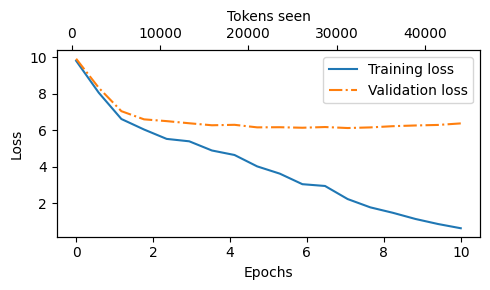

In [33]:
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

def plot_losses(epochs_seen, tokens_seen, train_losses, val_losses):
  fig, ax1 = plt.subplots(figsize=(5, 3))

  # plot training and validation loss against epochs
  ax1.plot(epochs_seen, train_losses, label="Training loss")
  ax1.plot(epochs_seen, val_losses, linestyle="-.", label="Validation loss")
  ax1.set_xlabel("Epochs")
  ax1.set_ylabel("Loss")
  ax1.legend(loc="upper right")
  ax1.xaxis.set_major_locator(MaxNLocator(integer=True)) # only show integer labels on x-axis

  # create a second x-axis for tokens seen
  ax2 = ax1.twiny() # create a second x-axis that shares the same y-axis
  ax2.plot(tokens_seen, train_losses, alpha=0) # invisible plot for aligning ticks
  ax2.set_xlabel("Tokens seen")

  fig.tight_layout() # adjust layout to make room
  plt.savefig("loss-plot.pdf")
  plt.show()

epochs_tensor = torch.linspace(0, num_epochs, len(train_losses))
plot_losses(epochs_tensor, tokens_seen, train_losses, val_losses)

## Decoding strategies to control randomness

In [34]:
# what we have as inference strategy is to select the token with highest probability(simplest and more reasonable approach)

# use cpu here as inference is cheap with
inference_device = torch.device("cpu")

model.to(inference_device)
model.eval()

tokenizer = tiktoken.get_encoding("gpt2")

token_ids = generate_text_simple(
    model=model,
    idx=text_to_token_ids("Every effort moves you", tokenizer).to(inference_device),
    max_new_tokens=25,
    context_size=GPT_CONFIG_124M["context_length"]
)

print("Output text:\n", token_ids_to_text(token_ids, tokenizer))

Output text:
 Every effort moves you?"

"Yes--quite insensible to the irony. She wanted him vindicated--and by me!"




This text generation example comes from the training set, which means the model has effectively memorized it (or may even be overfitting). During training, the goal is to make the model reproduce the target text as accurately as possible. However, during inference we often want the model to be more creative rather than simply repeating learned text, so we apply techniques that encourage diversity in the generated output.

### Temerature scaling

In [35]:
vocab = {
    "closer": 0,
    "every": 1,
    "effort": 2,
    "forward": 3,
    "inches": 4,
    "moves": 5,
    "pizza": 6,
    "toward": 7,
    "you": 8,
}

inverse_vocab = {v: k for k, v in vocab.items()}
print(inverse_vocab)

{0: 'closer', 1: 'every', 2: 'effort', 3: 'forward', 4: 'inches', 5: 'moves', 6: 'pizza', 7: 'toward', 8: 'you'}


In [36]:
# suppose input is "every effort moves you", and the LLM returns the following logits for the next token:
next_token_logits = torch.tensor(
    [4.51, 0.89, -1.90, 6.75, 1.63, -1.62, -1.89, 6.28, 1.79]
)

probas = torch.softmax(next_token_logits, dim=0)
print(probas)
next_token_id = torch.argmax(probas).item()
print(next_token_id)

# the next generated token is then as follows
print(inverse_vocab[next_token_id])

tensor([6.0907e-02, 1.6313e-03, 1.0019e-04, 5.7212e-01, 3.4190e-03, 1.3257e-04,
        1.0120e-04, 3.5758e-01, 4.0122e-03])
3
forward


In [37]:
# try torch.multinomial
torch.manual_seed(123)
next_token_id = torch.multinomial(probas, num_samples=1).item()
print(inverse_vocab[next_token_id])

forward


In [38]:
def print_sampled_tokens(probas):
  torch.manual_seed(123)
  sample = [torch.multinomial(probas, num_samples=1).item() for i in range(1_000)]
  sampled_ids = torch.bincount(torch.tensor(sample), minlength=len(probas))
  for i, freq in enumerate(sampled_ids):
    print(f"{freq} x {inverse_vocab[i]}")

In [39]:
print_sampled_tokens(probas)

73 x closer
0 x every
0 x effort
582 x forward
2 x inches
0 x moves
0 x pizza
343 x toward
0 x you


In [40]:
# influence the distribution of logits with temperature
def softmax_with_temperature(logits, temperature):
  scaled_logits = logits / temperature
  return torch.softmax(scaled_logits, dim=0)

In [41]:
# set some temperature values
temperatures = [1, 0.1, 5]  # original, higher confidence, and lower confidence

# calculate scaled probabilities
scaled_probas = [softmax_with_temperature(next_token_logits, T) for T in temperatures]
print(scaled_probas)

[tensor([6.0907e-02, 1.6313e-03, 1.0019e-04, 5.7212e-01, 3.4190e-03, 1.3257e-04,
        1.0120e-04, 3.5758e-01, 4.0122e-03]), tensor([1.8530e-10, 3.5189e-26, 2.6890e-38, 9.9099e-01, 5.7569e-23, 4.4220e-37,
        2.9718e-38, 9.0133e-03, 2.8514e-22]), tensor([0.1546, 0.0750, 0.0429, 0.2421, 0.0869, 0.0454, 0.0430, 0.2203, 0.0898])]


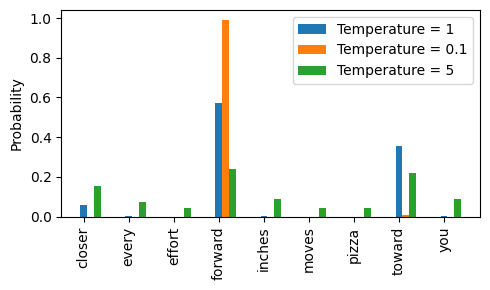

In [42]:
# plotting
x = torch.arange(len(vocab))
bar_width = 0.15

fig, ax = plt.subplots(figsize=(5, 3))
for i, T in enumerate(temperatures):
  rects = ax.bar(x + i * bar_width, scaled_probas[i], bar_width, label=f'Temperature = {T}')

ax.set_ylabel('Probability')
ax.set_xticks(x)
ax.set_xticklabels(vocab.keys(), rotation=90)
ax.legend()

plt.tight_layout()
plt.savefig("temperature-plot.pdf")
plt.show()

In [43]:
print_sampled_tokens(scaled_probas[1])

0 x closer
0 x every
0 x effort
985 x forward
0 x inches
0 x moves
0 x pizza
15 x toward
0 x you


In [44]:
print_sampled_tokens(scaled_probas[2])

165 x closer
75 x every
42 x effort
239 x forward
71 x inches
46 x moves
32 x pizza
227 x toward
103 x you


### Top-k sampling

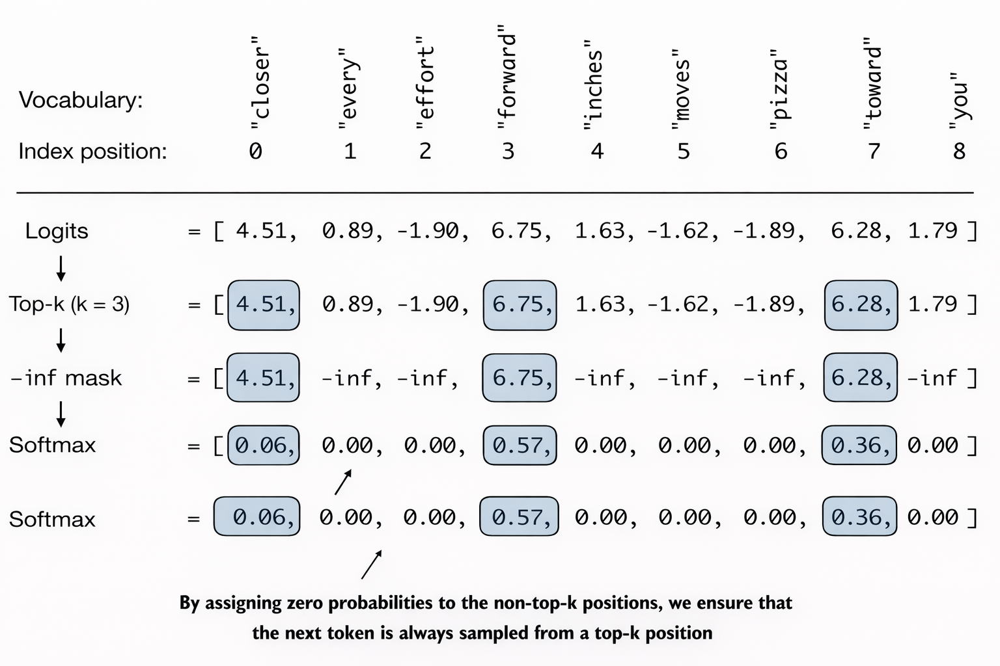

In [45]:
top_k = 3
top_logits, top_pos = torch.topk(next_token_logits, top_k)

print("Top logits:", top_logits)
print("Top positions:", top_pos)

Top logits: tensor([6.7500, 6.2800, 4.5100])
Top positions: tensor([3, 7, 0])


In [46]:
new_logits = torch.where(
    condition=next_token_logits < top_logits[-1],
    input=torch.tensor(float("-inf")),
    other=next_token_logits
)

print(new_logits)

tensor([4.5100,   -inf,   -inf, 6.7500,   -inf,   -inf,   -inf, 6.2800,   -inf])


In [47]:
topk_probas = torch.softmax(new_logits, dim=0)
print(topk_probas)

tensor([0.0615, 0.0000, 0.0000, 0.5775, 0.0000, 0.0000, 0.0000, 0.3610, 0.0000])


### Apply the startegies for text generation

In [48]:
def generate(model, idx, max_new_tokens, context_size, temperature=0.0, top_k=None, eos_id=None):

  # for-loop is the same as before: get logits, and only focus on last time step
  for _ in range(max_new_tokens):
    idx_cond = idx[:, -context_size:]
    with torch.no_grad():
      logits = model(idx_cond)
    logits = logits[:, -1, :]

    # filter logits with top_k sampling (new)
    if top_k is not None:
      # keep only top_k values
      top_logits, _ = torch.topk(logits, top_k)
      min_val = top_logits[:, -1]
      logits = torch.where(logits < min_val, torch.tensor(float("-inf")).to(logits.device), logits)

    # apply temperature scaling (new)
    if temperature > 0.0:
      logits = logits / temperature

      # numerical stability tip to get equivalent results on mps device (new)
      # subtract rowwise max before softmax
      logits = logits - logits.max(dim=-1, keepdim=True).values

      # apply softmax to get probabilities
      probs = torch.softmax(logits, dim=-1) # (batch_size, context_len)

      # sample from the distribution
      idx_next = torch.multinomial(probs, num_samples=1) # (batch_size, 1)

    # otherwise same as before: get idx of the vocab entry with the highest logits value
    else:
      idx_next = torch.argmax(logits, dim=-1, keepdim=True) # (batch_size, 1)

    if idx_next == eos_id: # stop generating early if end-of-sequence token is encountered and eos_id is specified
      break

    # same as before: append sampled index to the running sequence
    idx = torch.cat((idx, idx_next), dim=1) # (batch_size, num_tokens+1)

  return idx

In [49]:
torch.manual_seed(123)

token_ids = generate(
    model=model,
    idx=text_to_token_ids("Every effort moves you", tokenizer).to(inference_device),
    max_new_tokens=15,
    context_size=GPT_CONFIG_124M["context_length"],
    top_k=25,
    temperature=1.4
)

print("Output text:\n", token_ids_to_text(token_ids, tokenizer))

Output text:
 Every effort moves you?"
His up surprise. And whenever his glory, when by his head


## Use a (trained) LLM model to make inference for text generation

### Loading and saving model weights in PyTorch

In [50]:
# print(model.state_dict())

In [51]:
# save the model
torch.save(model.state_dict(), "model.pth")

In [52]:
# load the model
model = GPTModel(GPT_CONFIG_124M)

In [53]:
# set the device
if torch.cuda.is_available():
  device = torch.device("cuda")
elif torch.backends.mps.is_available():
  major, minor = map(int, torch.__version__.split(".")[:2])
  if (major, minor) >= (2, 9):
    device = torch.device("mps")
else:
  device = torch.device("cpu")

print("Device:", device)

Device: cuda


In [54]:
# load the model
model.load_state_dict(torch.load("model.pth", map_location=device, weights_only=True))
model.eval();

In [55]:
# save additional info
torch.save({
    "model_state_dict": model.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    },
    "model_and_optimizer.pth"
)

In [56]:
# load it
checkpoint = torch.load("model_and_optimizer.pth", weights_only=True)

model = GPTModel(GPT_CONFIG_124M)
model.load_state_dict(checkpoint["model_state_dict"])

optimizer = torch.optim.AdamW(model.parameters(), lr=0.0005, weight_decay=0.1)
optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
model.train();

### Loading pretrained weights from OpenAI

In [58]:
from gpt_download import download_and_load_gpt2

In [60]:
settings, params = download_and_load_gpt2(model_size="124M", models_dir="gpt2")

checkpoint: 100%|██████████| 77.0/77.0 [00:00<00:00, 144kiB/s]
encoder.json: 100%|██████████| 1.04M/1.04M [00:01<00:00, 561kiB/s]
hparams.json: 100%|██████████| 90.0/90.0 [00:00<00:00, 193kiB/s]
model.ckpt.data-00000-of-00001: 100%|██████████| 498M/498M [02:43<00:00, 3.04MiB/s]
model.ckpt.index: 100%|██████████| 5.21k/5.21k [00:00<00:00, 8.35MiB/s]
model.ckpt.meta: 100%|██████████| 471k/471k [00:01<00:00, 376kiB/s]
vocab.bpe: 100%|██████████| 456k/456k [00:01<00:00, 453kiB/s]


In [62]:
print("Settings:", settings)
# print("\nParameters:", params)

Settings: {'n_vocab': 50257, 'n_ctx': 1024, 'n_embd': 768, 'n_head': 12, 'n_layer': 12}


In [63]:
print("Parameter dictionary keys:", params.keys())

Parameter dictionary keys: dict_keys(['blocks', 'b', 'g', 'wpe', 'wte'])


In [64]:
# inspect weights for the token embeddings
print(params["wte"])
print("Token embedding weight tensor dimensions:", params["wte"].shape)

[[-0.11010301 -0.03926672  0.03310751 ... -0.1363697   0.01506208
   0.04531523]
 [ 0.04034033 -0.04861503  0.04624869 ...  0.08605453  0.00253983
   0.04318958]
 [-0.12746179  0.04793796  0.18410145 ...  0.08991534 -0.12972379
  -0.08785918]
 ...
 [-0.04453601 -0.05483596  0.01225674 ...  0.10435229  0.09783269
  -0.06952604]
 [ 0.1860082   0.01665728  0.04611587 ... -0.09625227  0.07847701
  -0.02245961]
 [ 0.05135201 -0.02768905  0.0499369  ...  0.00704835  0.15519823
   0.12067825]]
Token embedding weight tensor dimensions: (50257, 768)


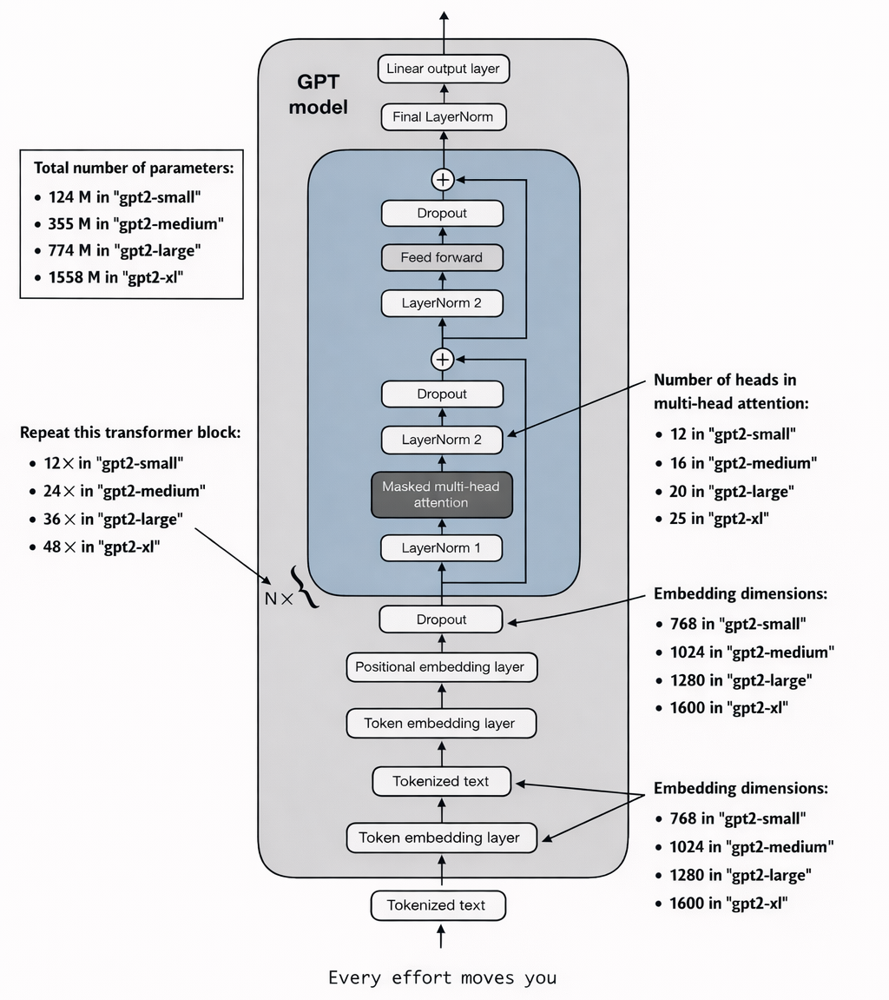

In [65]:
# current configuration
GPT_CONFIG_124M = {
    "vocab_size": 50257, "context_length": 256,  "emb_dim": 768, "n_heads": 12, "n_layers": 12, "drop_rate": 0.1, "qkv_bias": False
}

In [66]:
# define model configurations in a dictionary for compactness
model_configs = {
    "gpt2-small (124M)": {"emb_dim": 768, "n_layers": 12, "n_heads": 12},
    "gpt2-medium (355M)": {"emb_dim": 1024, "n_layers": 24, "n_heads": 16},
    "gpt2-large (774M)": {"emb_dim": 1280, "n_layers": 36, "n_heads": 20},
    "gpt2-xl (1558M)": {"emb_dim": 1600, "n_layers": 48, "n_heads": 25},
}

# copy the base configuration and update with specific model settings
NEW_CONFIG = GPT_CONFIG_124M.copy()
NEW_CONFIG.update({"context_length": 1024, "qkv_bias": True})
# print(NEW_CONFIG)

gpt = GPTModel(NEW_CONFIG)
gpt.eval();

In [70]:
def assign(left, right):
  if left.shape != right.shape:
    raise ValueError(f"Shape mismatch. Left: {left.shape}, Right: {right.shape}")
  return torch.nn.Parameter(torch.tensor(right))

In [71]:
import numpy as np

def load_weights_into_gpt(gpt, params):
  gpt.pos_emb.weight = assign(gpt.pos_emb.weight, params['wpe'])
  gpt.tok_emb.weight = assign(gpt.tok_emb.weight, params['wte'])

  # in openai's GPT 2, they have designed attention with combined Q, K, V (one W matrix), so to match our design, we split it into separate Ws
  for b in range(len(params["blocks"])):
    q_w, k_w, v_w = np.split(
        (params["blocks"][b]["attn"]["c_attn"])["w"], 3, axis=-1)
    gpt.trf_blocks[b].att.W_query.weight = assign(
        gpt.trf_blocks[b].att.W_query.weight, q_w.T)
    gpt.trf_blocks[b].att.W_key.weight = assign(
        gpt.trf_blocks[b].att.W_key.weight, k_w.T)
    gpt.trf_blocks[b].att.W_value.weight = assign(
        gpt.trf_blocks[b].att.W_value.weight, v_w.T)

    # they also use bias weights (we didn't)
    q_b, k_b, v_b = np.split(
        (params["blocks"][b]["attn"]["c_attn"])["b"], 3, axis=-1)
    gpt.trf_blocks[b].att.W_query.bias = assign(
        gpt.trf_blocks[b].att.W_query.bias, q_b)
    gpt.trf_blocks[b].att.W_key.bias = assign(
        gpt.trf_blocks[b].att.W_key.bias, k_b)
    gpt.trf_blocks[b].att.W_value.bias = assign(
        gpt.trf_blocks[b].att.W_value.bias, v_b)

    # get projecttion layer's weights
    gpt.trf_blocks[b].att.out_proj.weight = assign(
        gpt.trf_blocks[b].att.out_proj.weight,
        params["blocks"][b]["attn"]["c_proj"]["w"].T)
    gpt.trf_blocks[b].att.out_proj.bias = assign(
        gpt.trf_blocks[b].att.out_proj.bias,
        params["blocks"][b]["attn"]["c_proj"]["b"])

    # get ff layers weights
    gpt.trf_blocks[b].ff.layers[0].weight = assign(
        gpt.trf_blocks[b].ff.layers[0].weight,
        params["blocks"][b]["mlp"]["c_fc"]["w"].T)
    gpt.trf_blocks[b].ff.layers[0].bias = assign(
        gpt.trf_blocks[b].ff.layers[0].bias,
        params["blocks"][b]["mlp"]["c_fc"]["b"])
    gpt.trf_blocks[b].ff.layers[2].weight = assign(
        gpt.trf_blocks[b].ff.layers[2].weight,
        params["blocks"][b]["mlp"]["c_proj"]["w"].T)
    gpt.trf_blocks[b].ff.layers[2].bias = assign(
        gpt.trf_blocks[b].ff.layers[2].bias,
        params["blocks"][b]["mlp"]["c_proj"]["b"])

    # and layer norm weights
    gpt.trf_blocks[b].norm1.scale = assign(
        gpt.trf_blocks[b].norm1.scale,
        params["blocks"][b]["ln_1"]["g"])
    gpt.trf_blocks[b].norm1.shift = assign(
        gpt.trf_blocks[b].norm1.shift,
        params["blocks"][b]["ln_1"]["b"])
    gpt.trf_blocks[b].norm2.scale = assign(
        gpt.trf_blocks[b].norm2.scale,
        params["blocks"][b]["ln_2"]["g"])
    gpt.trf_blocks[b].norm2.shift = assign(
        gpt.trf_blocks[b].norm2.shift,
        params["blocks"][b]["ln_2"]["b"])

  gpt.final_norm.scale = assign(gpt.final_norm.scale, params["g"])
  gpt.final_norm.shift = assign(gpt.final_norm.shift, params["b"])
  gpt.out_head.weight = assign(gpt.out_head.weight, params["wte"]) # the input and output layers share the same weights

In [72]:
# load the openai weights to the object of new GPT
load_weights_into_gpt(gpt, params)
gpt.to(device);

In [73]:
torch.manual_seed(123)

token_ids = generate(
    model=gpt,
    idx=text_to_token_ids("Every effort moves you", tokenizer).to(device),
    max_new_tokens=25,
    context_size=NEW_CONFIG["context_length"],
    top_k=50,
    temperature=1.5
)

print("Output text:\n", token_ids_to_text(token_ids, tokenizer))

Output text:
 Every effort moves you as far as the hand can go until the end of your turn unless something happens

This would remove you from a battle


As we can see, the text generated using OpenAI's pretrained weights is significantly better than the output from our simple implementation (which was only trained for a few minutes). This is expected, since OpenAI's model has been trained much longer and on a far larger dataset. Additionally, this is the smallest model in the family and using larger models further improves text quality and coherence, demonstrating clear progress in generation capability.